<a href="https://colab.research.google.com/github/Deyonrose/computer_vision/blob/main/2348513_cv_lab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

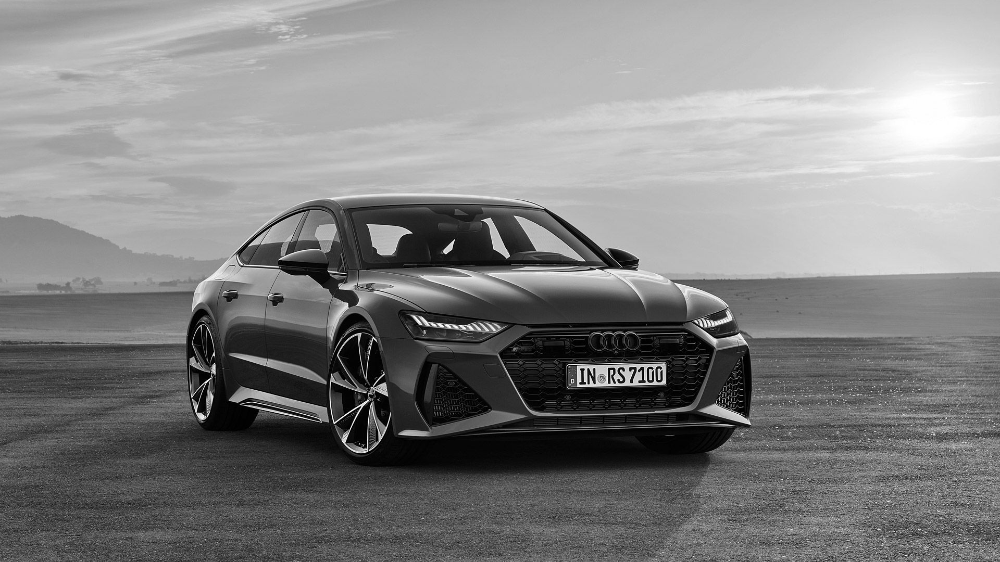

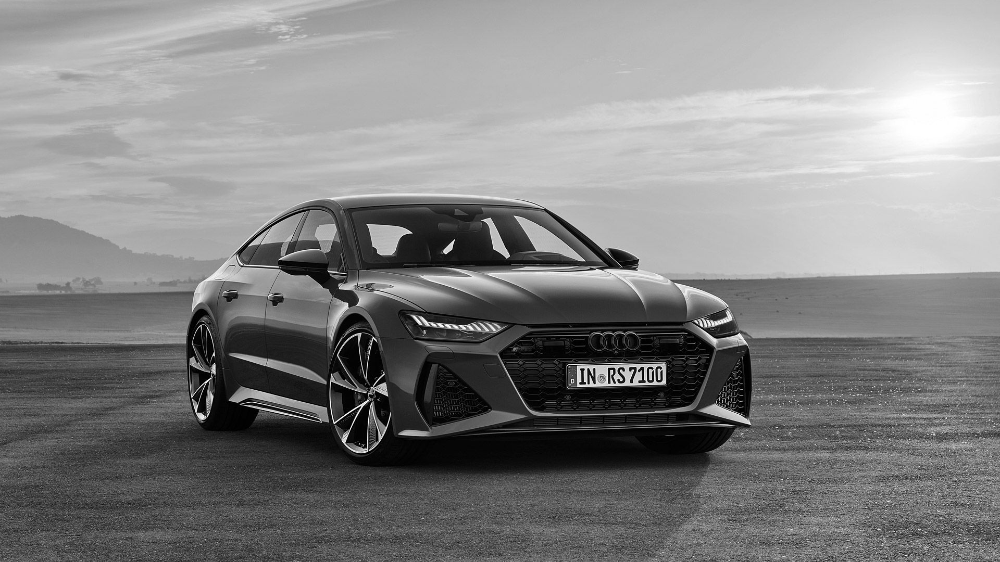

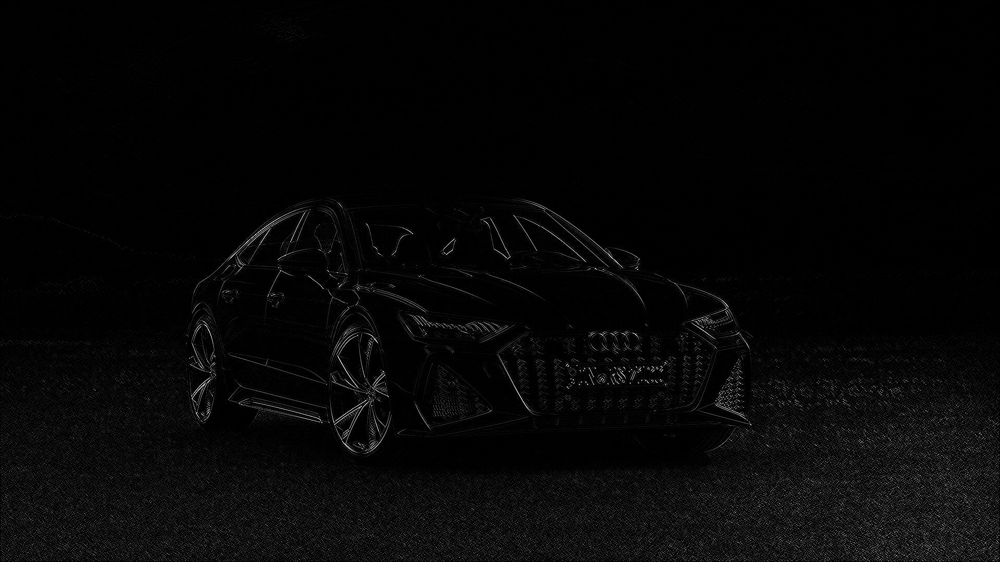

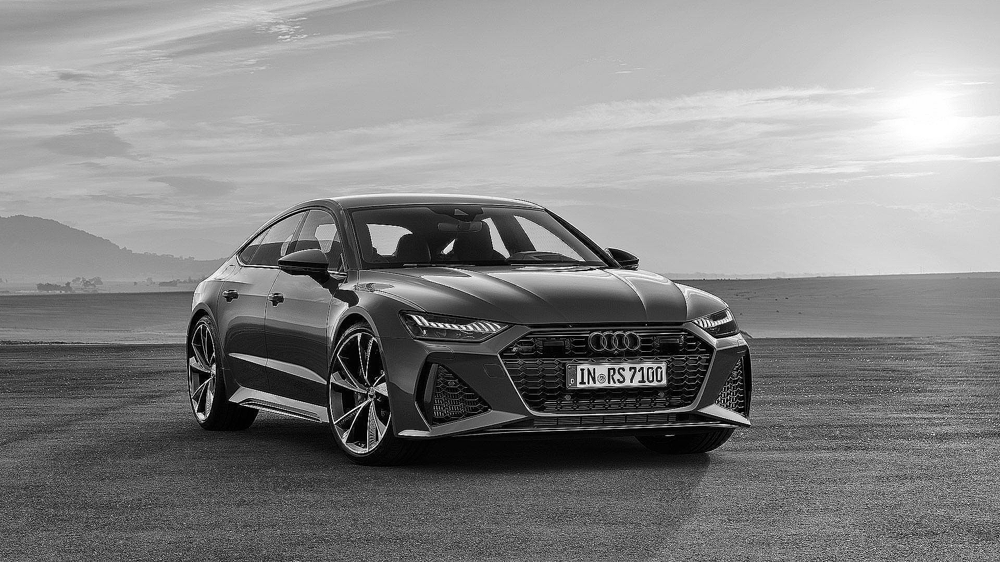

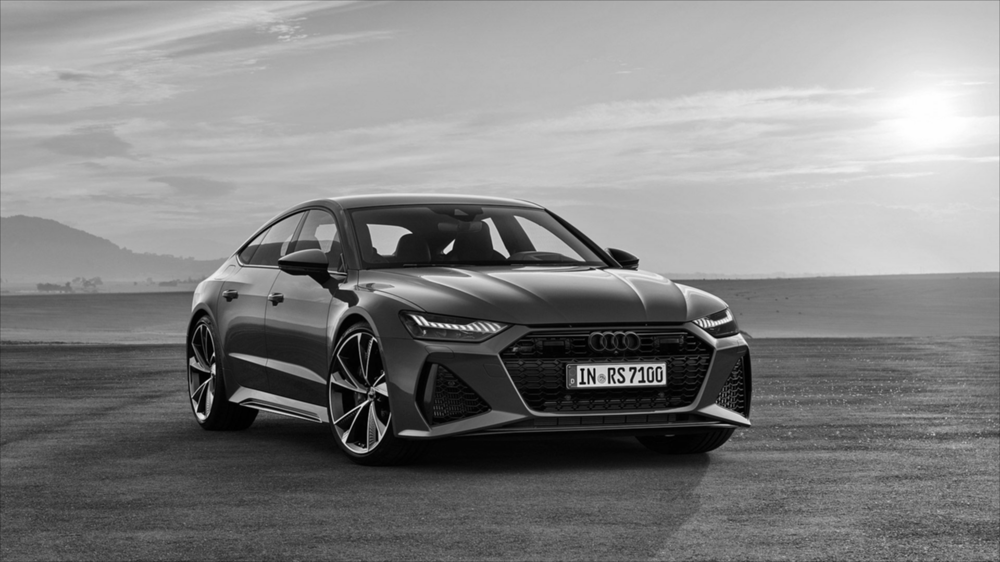

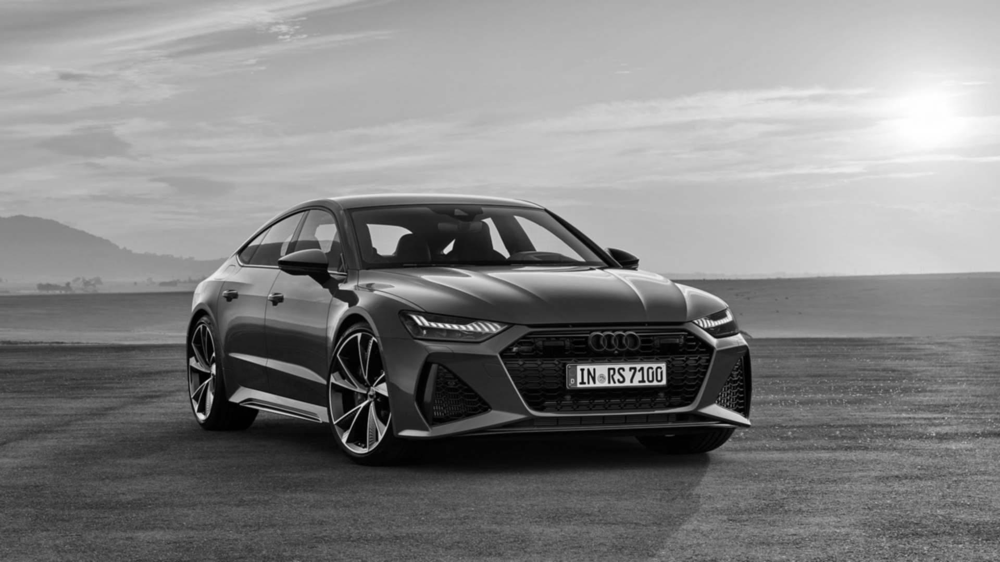

In [ ]:
import cv2
import numpy as np
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage
import nltk

# Load the image
image = cv2.imread('audi_rs7.jpg', cv2.IMREAD_GRAYSCALE)

# Define kernels
identity_kernel = np.array([[0, 0, 0],
                            [0, 1, 0],
                            [0, 0, 0]])

edge_detection_kernel = np.array([[1, 0, -1],
                                   [0, 0, 0],
                                   [-1, 0, 1]])

sharpen_kernel = np.array([[0, -1, 0],
                            [-1, 5, -1],
                            [0, -1, 0]])

box_blur_kernel = np.ones((3, 3), dtype=np.float32) / 9

gaussian_kernel = np.array([[1, 2, 1],
                            [2, 4, 2],
                            [1, 2, 1]], dtype=np.float32) / 16


identity_result = cv2.filter2D(image, -1, identity_kernel)
edge_detection_result = cv2.filter2D(image, -1, edge_detection_kernel)
sharpen_result = cv2.filter2D(image, -1, sharpen_kernel)

# Perform convolution operation using convolve2d
box_blur_result = convolve2d(image, box_blur_kernel, mode='same', boundary='fill', fillvalue=0)
gaussian_blur_result = gaussian_filter(image, sigma=1)

# Display the results
cv2_imshow(image)
cv2_imshow(identity_result)
cv2_imshow(edge_detection_result)
cv2_imshow(sharpen_result)
cv2_imshow((box_blur_result).astype(np.uint8))
cv2_imshow((gaussian_blur_result).astype(np.uint8))

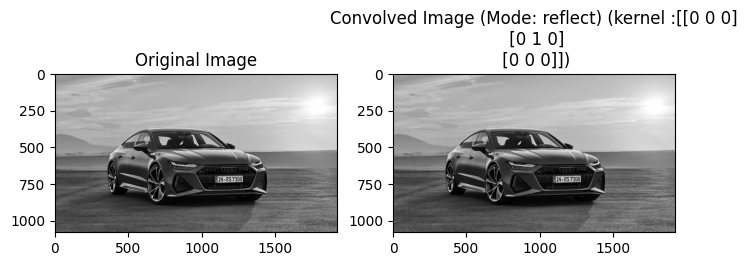

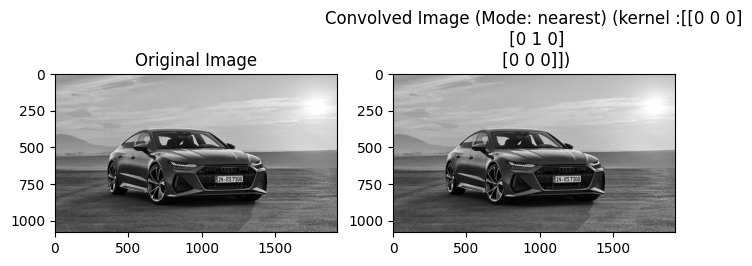

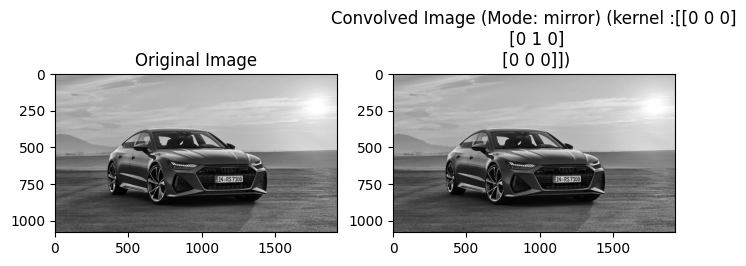

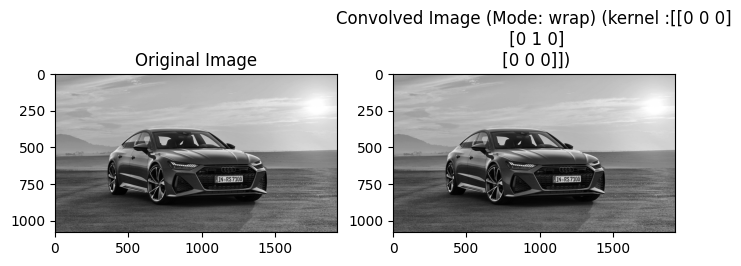

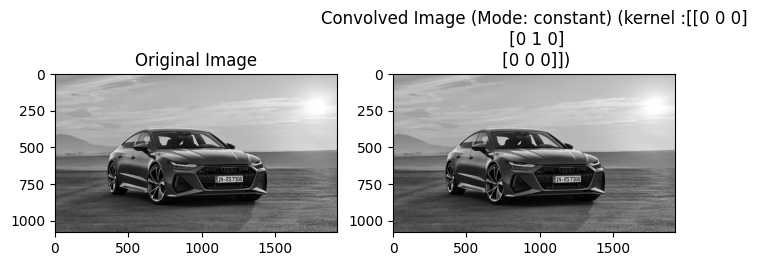

...

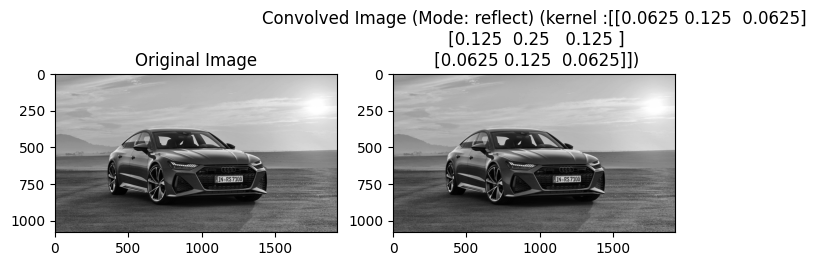

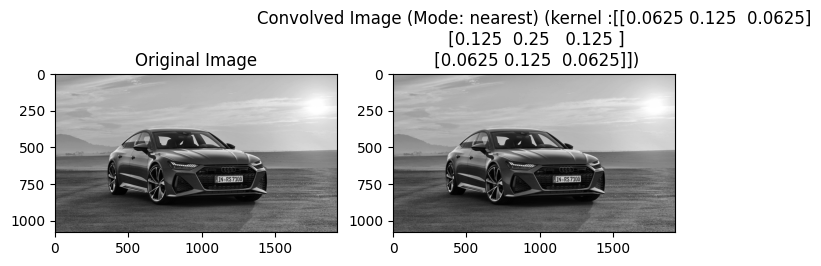

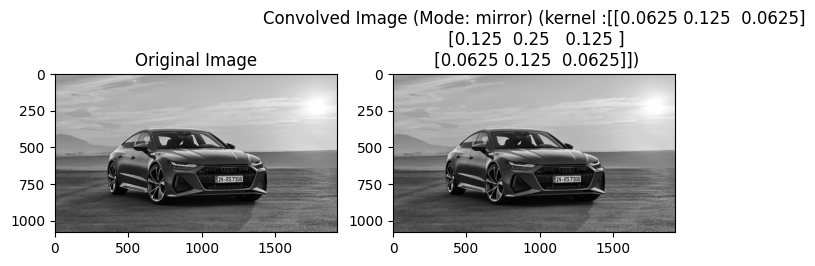

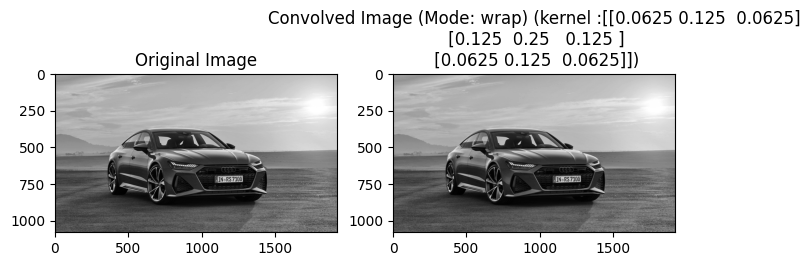

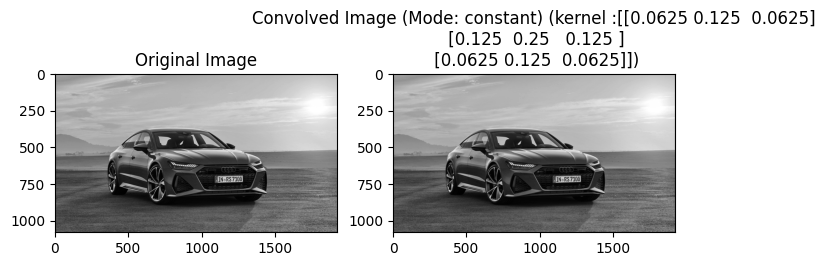

In [ ]:

kernels = [identity_kernel, edge_detection_kernel, sharpen_kernel,box_blur_kernel ,gaussian_kernel]
modes = ['reflect', 'nearest', 'mirror', 'wrap','constant']

for kernel in kernels:

    for mode in modes:
        result = ndimage.convolve(image, kernel, mode=mode, cval=0.0)

        plt.figure(figsize=(8, 4))

        plt.subplot(1, 2, 1)
        plt.imshow(image, cmap='gray')
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(result, cmap='gray')
        plt.title(f'Convolved Image (Mode: {mode}) (kernel :{kernel})')

        plt.show()